In [1]:
import pandas as pd
import numpy as np
import scipy as sp


In [2]:
data = pd.read_csv('/Users/kk/Desktop/etf_addendum/Final ETF Table/df_merged_etf_3170cols_final.csv')
data

,Unnamed: 0,ticker,one_yr_return,expense_ratio,aum,dividend_yield,fundname,esg_rating,quality_score,score_peer_rank,...,three_mo,ytd,one_yr,three_yr,as_of_date,subsegment,asset_class,region,asset_class_2,asset_class_filter
0,0,SPY,17.03,0.09,4.259800e+11,1.60,SPDR S&P 500 ETF Trust,A,6.68,58.71,...,8.169170e+09,1.789010e+09,1.330168e+10,2.274163e+10,2023-07-25,Large Cap,Equity,U.S.,Equity,standard
1,1,IVV,17.08,0.03,3.516200e+11,1.60,iShares Core S&P 500 ETF,A,6.68,58.67,...,1.079041e+10,8.072130e+09,1.406733e+10,6.043107e+10,2023-07-25,Large Cap,Equity,U.S.,Equity,standard
2,2,VOO,17.09,0.03,3.363100e+11,1.60,Vanguard 500 Index Fund,A,6.68,58.75,...,1.615885e+10,2.322101e+10,3.507396e+10,1.102676e+11,2023-07-25,Large Cap,Equity,U.S.,Equity,standard
3,3,VTI,16.46,0.03,3.196800e+11,1.56,Vanguard Total Stock Market ETF,A,6.52,52.51,...,6.017330e+09,9.869710e+09,2.185189e+10,1.007913e+11,2023-07-25,Total Market,Equity,U.S.,Equity,standard
4,4,QQQ,27.05,0.20,2.093000e+11,0.75,Invesco QQQ Trust,A,6.71,59.94,...,8.995940e+09,4.850110e+09,4.059080e+09,3.413248e+10,2023-07-25,Large Cap,Equity,U.S.,Equity,standard
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3163,3163,AVNM,NaN,0.31,2.627800e+05,NaN,Avantis All International Markets Equity ETF,NaN,NaN,NaN,...,1.300000e+05,1.300000e+05,1.300000e+05,1.300000e+05,2023-07-25,U.S. - Total Market,Equity,Global Ex,Equity,standard
3164,3164,SPKY,NaN,0.79,2.460500e+05,NaN,ConvexityShares Daily 1.5x SPIKES Futures ETF,NaN,NaN,NaN,...,-1.300000e+05,2.400000e+05,1.760000e+06,1.760000e+06,2023-07-25,Term,Leveraged Alternatives,Volatility S&P 500 Short,Leveraged Alternatives,leveraged
3165,3165,FLRU,NaN,0.19,8.000000e+03,NaN,Franklin FTSE Russia ETF,CCC,NaN,NaN,...,NaN,NaN,NaN,1.209000e+07,NaN,Total Market,Equity,Russia,Equity,standard
3166,3166,SROI,NaN,0.95,NaN,1.93,Calamos Antetokounmpo Global Sustainable Equit...,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,2023-07-25,Total Market,Equity,Global,Equity,standard


In [3]:
origiginal_nums = data.iloc[[1,2,3,4,5,]]

In [4]:
data.isna().sum()

Unnamed: 0                            0
ticker                                0
one_yr_return                       438
expense_ratio                         9
aum                                   2
dividend_yield                     1499
fundname                              1
esg_rating                          985
quality_score                      1088
score_peer_rank                    1088
score_global_rank                  1128
carbon_intensity                   1177
sri_screening_criteria_exposure    1499
analyst_pick                          0
grade                              1648
efficiency                         1056
tradability                        1200
fit                                2194
segment                               0
one_mo_p_percent                     56
three_mo_p_percent                  131
ytd_p_percent                       241
one_yr_p_percent                    438
three_yr_p_percent                 1183
five_yr_p_percent                  1583


In [5]:
umap3d_plotly = pd.read_csv('/Users/kk/Desktop/etf_addendum/Final ETF Table/umap_tables/umap_3D_plotly.csv')
umap3d_plotly

,Unnamed: 0,UMAP1,UMAP2,UMAP3
0,0,-1.253997,9.577052,10.705726
1,1,-1.227891,9.556663,10.740655
2,2,-1.258907,9.571280,10.706127
3,3,-1.271442,9.582371,10.711217
4,4,-1.245133,9.574322,10.735934
...,...,...,...,...
3163,3163,6.209751,10.754849,8.710507
3164,3164,4.793402,5.936837,1.454061
3165,3165,6.180159,13.594825,-1.168721
3166,3166,4.475554,9.735441,10.390327


In [6]:
esg = data
esg.head()


,Unnamed: 0,ticker,one_yr_return,expense_ratio,aum,dividend_yield,fundname,esg_rating,quality_score,score_peer_rank,...,three_mo,ytd,one_yr,three_yr,as_of_date,subsegment,asset_class,region,asset_class_2,asset_class_filter
0,0,SPY,17.03,0.09,4.259800e+11,1.60,SPDR S&P 500 ETF Trust,A,6.68,58.71,...,8.169170e+09,1.789010e+09,1.330168e+10,2.274163e+10,2023-07-25,Large Cap,Equity,U.S.,Equity,standard
1,1,IVV,17.08,0.03,3.516200e+11,1.60,iShares Core S&P 500 ETF,A,6.68,58.67,...,1.079041e+10,8.072130e+09,1.406733e+10,6.043107e+10,2023-07-25,Large Cap,Equity,U.S.,Equity,standard
2,2,VOO,17.09,0.03,3.363100e+11,1.60,Vanguard 500 Index Fund,A,6.68,58.75,...,1.615885e+10,2.322101e+10,3.507396e+10,1.102676e+11,2023-07-25,Large Cap,Equity,U.S.,Equity,standard
3,3,VTI,16.46,0.03,3.196800e+11,1.56,Vanguard Total Stock Market ETF,A,6.52,52.51,...,6.017330e+09,9.869710e+09,2.185189e+10,1.007913e+11,2023-07-25,Total Market,Equity,U.S.,Equity,standard
4,4,QQQ,27.05,0.20,2.093000e+11,0.75,Invesco QQQ Trust,A,6.71,59.94,...,8.995940e+09,4.850110e+09,4.059080e+09,3.413248e+10,2023-07-25,Large Cap,Equity,U.S.,Equity,standard


In [7]:
esg.isna().sum()

Unnamed: 0                            0
ticker                                0
one_yr_return                       438
expense_ratio                         9
aum                                   2
dividend_yield                     1499
fundname                              1
esg_rating                          985
quality_score                      1088
score_peer_rank                    1088
score_global_rank                  1128
carbon_intensity                   1177
sri_screening_criteria_exposure    1499
analyst_pick                          0
grade                              1648
efficiency                         1056
tradability                        1200
fit                                2194
segment                               0
one_mo_p_percent                     56
three_mo_p_percent                  131
ytd_p_percent                       241
one_yr_p_percent                    438
three_yr_p_percent                 1183
five_yr_p_percent                  1583


In [8]:
data['UMAP1'] = umap3d_plotly['UMAP1']
data['UMAP2'] = umap3d_plotly['UMAP2']
data['UMAP3'] = umap3d_plotly['UMAP3']
data['esg_rating'] = esg['esg_rating']
data['grade'] = esg['grade']
data['dividend_yield'] = esg['dividend_yield']
data['one_mo_p_percent']  = esg['one_mo_p_percent'] 
data['one_yr_p_percent'] = esg['one_yr_p_percent']
data['ytd_p_percent'] = esg['ytd_p_percent']
data['carbon_intensity'] = esg['carbon_intensity']
data['name'] = esg['fundname']
data['ticker'] = esg['ticker']

In [9]:
data.isna().sum()

Unnamed: 0                            0
ticker                                0
one_yr_return                       438
expense_ratio                         9
aum                                   2
dividend_yield                     1499
fundname                              1
esg_rating                          985
quality_score                      1088
score_peer_rank                    1088
score_global_rank                  1128
carbon_intensity                   1177
sri_screening_criteria_exposure    1499
analyst_pick                          0
grade                              1648
efficiency                         1056
tradability                        1200
fit                                2194
segment                               0
one_mo_p_percent                     56
three_mo_p_percent                  131
ytd_p_percent                       241
one_yr_p_percent                    438
three_yr_p_percent                 1183
five_yr_p_percent                  1583


In [10]:

# Replace 'your_column_name' with the actual name of the column(s) where you want to replace '-'

data.replace('-', '', inplace=True)

data.head()

,Unnamed: 0,ticker,one_yr_return,expense_ratio,aum,dividend_yield,fundname,esg_rating,quality_score,score_peer_rank,...,as_of_date,subsegment,asset_class,region,asset_class_2,asset_class_filter,UMAP1,UMAP2,UMAP3,name
0,0,SPY,17.03,0.09,4.259800e+11,1.60,SPDR S&P 500 ETF Trust,A,6.68,58.71,...,2023-07-25,Large Cap,Equity,U.S.,Equity,standard,-1.253997,9.577052,10.705726,SPDR S&P 500 ETF Trust
1,1,IVV,17.08,0.03,3.516200e+11,1.60,iShares Core S&P 500 ETF,A,6.68,58.67,...,2023-07-25,Large Cap,Equity,U.S.,Equity,standard,-1.227891,9.556663,10.740655,iShares Core S&P 500 ETF
2,2,VOO,17.09,0.03,3.363100e+11,1.60,Vanguard 500 Index Fund,A,6.68,58.75,...,2023-07-25,Large Cap,Equity,U.S.,Equity,standard,-1.258907,9.571280,10.706127,Vanguard 500 Index Fund
3,3,VTI,16.46,0.03,3.196800e+11,1.56,Vanguard Total Stock Market ETF,A,6.52,52.51,...,2023-07-25,Total Market,Equity,U.S.,Equity,standard,-1.271442,9.582371,10.711217,Vanguard Total Stock Market ETF
4,4,QQQ,27.05,0.20,2.093000e+11,0.75,Invesco QQQ Trust,A,6.71,59.94,...,2023-07-25,Large Cap,Equity,U.S.,Equity,standard,-1.245133,9.574322,10.735934,Invesco QQQ Trust


In [11]:
filters = pd.read_csv('/Users/kk/Desktop/etf_addendum/Final ETF Table/umap_tables/filters.csv')
filters

,Unnamed: 0,invest_strategy,asset_class,asset_region,subsegment,ticker
0,0,standard,equity,region_us,large_cap,SPY
1,1,standard,equity,region_us,large_cap,IVV
2,2,standard,equity,region_us,large_cap,VOO
3,3,standard,equity,region_us,total_market,VTI
4,4,standard,equity,region_us,large_cap,QQQ
...,...,...,...,...,...,...
3163,3163,standard,equity,region_global,total_market,AVNM
3164,3164,leveraged,alternatives,region_global,other,SPKY
3165,3165,standard,equity,region_brics,total_market,FLRU
3166,3166,standard,equity,region_global,total_market,SROI


In [12]:
data = data.replace({'': 'NA'})

In [13]:
#data.dtypes
data['name'] = data['name'].astype(str)
data['ticker'] = data['ticker'].astype(str)
data['aum'] = data['aum'].astype(float)                        
data['dividend_yield'] = data['dividend_yield'].astype(float)  
data['esg_rating'] = data['esg_rating'].astype(str)                         
data['grade'] = data['grade'].astype(str)                           
data['quality_score'] = data['quality_score'].astype(float)                       
data['score_peer_rank'] = data['score_peer_rank'].astype(float)                     
data['score_global_rank'] = data['score_global_rank'].astype(float)                   
data['carbon_intensity'] = data['carbon_intensity'].astype(float)                    
data['sri_screening_criteria_exposure'] = data['sri_screening_criteria_exposure'].astype(float)     
data['one_mo_p_percent'] = data['one_mo_p_percent'].astype(float)                    
data['three_mo_p_percent'] = data['three_mo_p_percent'].astype(float)                                      
data['one_yr_p_percent'] = data['one_yr_p_percent'].astype(float)  
data['subsegment'] = filters['subsegment'].astype(str)
data['asset_region'] = filters['asset_region'].astype(str)
data['asset_class'] = filters['asset_class'].astype(str)
data['invest_strategy'] = filters['invest_strategy'].astype(str)                 

In [14]:
import plotly.express as px

In [15]:
import plotly.express as px

# Assuming you have your DataFrame named 'data'

fig = px.scatter_3d(data, x='UMAP1', y='UMAP2', z='UMAP3', color='asset_region', hover_data=['ticker','name','aum', 'dividend_yield',
'esg_rating' ,'grade' ,'one_mo_p_percent', 'one_yr_p_percent', 'ytd_p_percent', 'carbon_intensity' ,'subsegment', 
'asset_region', 'asset_class', 'invest_strategy'])

# Customize the appearance of the plot
fig.update_layout(
    title="Interactive 3D UMAP Plot - Asset Region",
    scene=dict(
        xaxis_title='UMAP Dimension 1',
        yaxis_title='UMAP Dimension 2',
        zaxis_title='UMAP Dimension 3',
        #bgcolor='black'  # Set background color to black
    )
)

# Change sphere size
fig.update_traces(marker_size=2)

# Use "prism" color palette for discrete colors
color_palette = px.colors.qualitative.Plotly
#fig.update_traces(marker=dict(color=data['color_reg'].map({k: color_palette[i % len(color_palette)] for i, k in enumerate(data['color_reg'].unique())})))

# Customize the background grid
fig.update_scenes(xaxis=dict(gridcolor='grey', gridwidth=0.5),
                  yaxis=dict(gridcolor='grey', gridwidth=0.5),
                  zaxis=dict(gridcolor='grey', gridwidth=0.5))

# Save the plot as an HTML file
fig.write_html('3D_UMAP_col_region.html')

# Show the plot
fig.show()



In [16]:
algotab = pd.read_csv('/Users/kk/Desktop/etf_addendum/Final ETF Table/algotab.csv')
data= pd.concat([data, algotab.cluster_8.astype(object)], axis=1)


fig = px.scatter_3d(data, x='UMAP1', y='UMAP2', z='UMAP3', color='cluster_8', hover_data=['ticker','name','aum', 'dividend_yield',
'esg_rating' ,'grade' ,'one_mo_p_percent', 'one_yr_p_percent', 'ytd_p_percent', 'carbon_intensity' ,'subsegment', 
'asset_region', 'asset_class', 'invest_strategy', 'cluster_8'])

# Customize the appearance of the plot
fig.update_layout(
    title="Interactive 3D UMAP Plot - cluster",
    scene=dict(
        xaxis_title='UMAP Dimension 1',
        yaxis_title='UMAP Dimension 2',
        zaxis_title='UMAP Dimension 3',
        #bgcolor='black'  # Set background color to black
    )
)

# Change sphere size
fig.update_traces(marker_size=2)

# Use "prism" color palette for discrete colors
color_palette = px.colors.qualitative.Plotly
#fig.update_traces(marker=dict(color=data['color_reg'].map({k: color_palette[i % len(color_palette)] for i, k in enumerate(data['color_reg'].unique())})))

# Customize the background grid
fig.update_scenes(xaxis=dict(gridcolor='grey', gridwidth=0.5),
                  yaxis=dict(gridcolor='grey', gridwidth=0.5),
                  zaxis=dict(gridcolor='grey', gridwidth=0.5))

# Save the plot as an HTML file
fig.write_html('3D_UMAP_col_region.html')

# Show the plot
fig.show()


In [17]:
fig = px.scatter_3d(data, x='UMAP1', y='UMAP2', z='UMAP3', color='asset_class', hover_data=['ticker','name','aum', 'dividend_yield',
'esg_rating' ,'grade' ,'one_mo_p_percent', 'one_yr_p_percent', 'ytd_p_percent', 'carbon_intensity' ,'subsegment', 
'asset_region', 'asset_class', 'invest_strategy'])

# Customize the appearance of the plot
fig.update_layout(
    title="Interactive 3D UMAP Plot - Asset Class",
    scene=dict(
        xaxis_title='UMAP Dimension 1',
        yaxis_title='UMAP Dimension 2',
        zaxis_title='UMAP Dimension 3',
        #bgcolor='black'  # Set background color to black
    )
)

# Change sphere size
fig.update_traces(marker_size=2)

# Use "prism" color palette for discrete colors
color_palette = px.colors.qualitative.Plotly
#fig.update_traces(marker=dict(color=data['color_reg'].map({k: color_palette[i % len(color_palette)] for i, k in enumerate(data['color_reg'].unique())})))

# Customize the background grid
fig.update_scenes(xaxis=dict(gridcolor='grey', gridwidth=0.5),
                  yaxis=dict(gridcolor='grey', gridwidth=0.5),
                  zaxis=dict(gridcolor='grey', gridwidth=0.5))

# Save the plot as an HTML file
fig.write_html('3D_UMAP_col_class.html')

# Show the plot
fig.show()


In [18]:
fig = px.scatter_3d(data, x='UMAP1', y='UMAP2', z='UMAP3', color='subsegment', hover_data=['ticker','name','aum', 'dividend_yield',
'esg_rating' ,'grade' ,'one_mo_p_percent', 'one_yr_p_percent', 'ytd_p_percent', 'carbon_intensity' ,'subsegment', 
'asset_region', 'asset_class', 'invest_strategy'])

# Customize the appearance of the plot
fig.update_layout(
    title="Interactive 3D UMAP Plot - Asset Subsegment",
    scene=dict(
        xaxis_title='UMAP Dimension 1',
        yaxis_title='UMAP Dimension 2',
        zaxis_title='UMAP Dimension 3',
        #bgcolor='black'  # Set background color to black
    )
)

# Change sphere size
fig.update_traces(marker_size=2)

# Use "prism" color palette for discrete colors
color_palette = px.colors.qualitative.Plotly
#fig.update_traces(marker=dict(color=data['color_reg'].map({k: color_palette[i % len(color_palette)] for i, k in enumerate(data['color_reg'].unique())})))

# Customize the background grid
fig.update_scenes(xaxis=dict(gridcolor='grey', gridwidth=0.5),
                  yaxis=dict(gridcolor='grey', gridwidth=0.5),
                  zaxis=dict(gridcolor='grey', gridwidth=0.5))

# Save the plot as an HTML file
fig.write_html('3D_UMAP_col_subsegment.html')

# Show the plot
fig.show()


In [19]:
fig = px.scatter_3d(data, x='UMAP1', y='UMAP2', z='UMAP3', color='invest_strategy', hover_data=['ticker','name','aum', 'dividend_yield',
'esg_rating' ,'grade' ,'one_mo_p_percent', 'one_yr_p_percent', 'ytd_p_percent', 'carbon_intensity' ,'subsegment', 
'asset_region', 'asset_class', 'invest_strategy'])

# Customize the appearance of the plot
fig.update_layout(
    title="Interactive 3D UMAP Plot - Inestment Strategy",
    scene=dict(
        xaxis_title='UMAP Dimension 1',
        yaxis_title='UMAP Dimension 2',
        zaxis_title='UMAP Dimension 3',
        #bgcolor='black'  # Set background color to black
    )
)

# Change sphere size
fig.update_traces(marker_size=2)

# Use "prism" color palette for discrete colors
color_palette = px.colors.qualitative.Plotly
#fig.update_traces(marker=dict(color=data['color_reg'].map({k: color_palette[i % len(color_palette)] for i, k in enumerate(data['color_reg'].unique())})))

# Customize the background grid
fig.update_scenes(xaxis=dict(gridcolor='grey', gridwidth=0.5),
                  yaxis=dict(gridcolor='grey', gridwidth=0.5),
                  zaxis=dict(gridcolor='grey', gridwidth=0.5))

# Save the plot as an HTML file
fig.write_html('3D_UMAP_col_strategy.html')

# Show the plot
fig.show()


In [20]:
fig = px.scatter_3d(data, x='UMAP1', y='UMAP2', z='UMAP3', color='esg_rating', hover_data=['ticker','name','aum', 'dividend_yield',
'esg_rating' ,'grade' ,'one_mo_p_percent', 'one_yr_p_percent', 'ytd_p_percent', 'carbon_intensity' ,'subsegment', 
'asset_region', 'asset_class', 'invest_strategy'])

# Customize the appearance of the plot
fig.update_layout(
    title="Interactive 3D UMAP Plot - ESG Rating",
    scene=dict(
        xaxis_title='UMAP Dimension 1',
        yaxis_title='UMAP Dimension 2',
        zaxis_title='UMAP Dimension 3',
        #bgcolor='black'  # Set background color to black
    )
)

# Change sphere size
fig.update_traces(marker_size=2)

# Use "prism" color palette for discrete colors
color_palette = px.colors.qualitative.Plotly
#fig.update_traces(marker=dict(color=data['color_reg'].map({k: color_palette[i % len(color_palette)] for i, k in enumerate(data['color_reg'].unique())})))

# Customize the background grid
fig.update_scenes(xaxis=dict(gridcolor='grey', gridwidth=0.5),
                  yaxis=dict(gridcolor='grey', gridwidth=0.5),
                  zaxis=dict(gridcolor='grey', gridwidth=0.5))

# Save the plot as an HTML file
fig.write_html('3D_UMAP_col_esg_rating.html')

# Show the plot
fig.show()


In [21]:
fig = px.scatter_3d(data, x='UMAP1', y='UMAP2', z='UMAP3', color='grade', hover_data=['ticker','name','aum', 'dividend_yield',
'esg_rating' ,'grade' ,'one_mo_p_percent', 'one_yr_p_percent', 'ytd_p_percent', 'carbon_intensity' ,'subsegment', 
'asset_region', 'asset_class', 'invest_strategy'])

# Customize the appearance of the plot
fig.update_layout(
    title="Interactive 3D UMAP Plot - ETF Grade",
    scene=dict(
        xaxis_title='UMAP Dimension 1',
        yaxis_title='UMAP Dimension 2',
        zaxis_title='UMAP Dimension 3',
        #bgcolor='black'  # Set background color to black
    )
)

# Change sphere size
fig.update_traces(marker_size=2)

# Use "prism" color palette for discrete colors
color_palette = px.colors.qualitative.Plotly
#fig.update_traces(marker=dict(color=data['color_reg'].map({k: color_palette[i % len(color_palette)] for i, k in enumerate(data['color_reg'].unique())})))

# Customize the background grid
fig.update_scenes(xaxis=dict(gridcolor='grey', gridwidth=0.5),
                  yaxis=dict(gridcolor='grey', gridwidth=0.5),
                  zaxis=dict(gridcolor='grey', gridwidth=0.5))

# Save the plot as an HTML file
fig.write_html('3D_UMAP_col_grade.html')

# Show the plot
fig.show()

In [22]:
def get_div_categories(column):
    new_column = []
    for value in column:
        if value > 0 and value <= 1.3:
            new_column.append('q1')
        elif value > 1.3 and value <= 1.96:
            new_column.append('q2')
        elif value > 1.96 and value <= 2.372:
            new_column.append('q3')
        elif value > 2.372 and value <= 3.06:
            new_column.append('q4')
        elif value <= 3.06:       
            new_column.append('high')
        else:
            new_column.append('NA')
    return new_column



In [23]:
data['dividend_yield_category'] = get_div_categories(data['dividend_yield'])
data['dividend_yield_category']

0       q2
1       q2
2       q2
3       q2
4       q1
        ..
3163    NA
3164    NA
3165    NA
3166    q2
3167    NA
Name: dividend_yield_category, Length: 3168, dtype: object

In [24]:
data['dividend_yield_category'].isna().sum()

0

In [25]:
fig = px.scatter_3d(data, x='UMAP1', y='UMAP2', z='UMAP3', color='dividend_yield_category', hover_data=['ticker','name','aum', 'dividend_yield',
'esg_rating' ,'grade' ,'one_mo_p_percent', 'one_yr_p_percent', 'ytd_p_percent', 'carbon_intensity' ,'subsegment', 
'asset_region', 'asset_class', 'invest_strategy'])

# Customize the appearance of the plot
fig.update_layout(
    title="Interactive 3D UMAP Plot - Dividend Yield",
    scene=dict(
        xaxis_title='UMAP Dimension 1',
        yaxis_title='UMAP Dimension 2',
        zaxis_title='UMAP Dimension 3',
        #bgcolor='black'  # Set background color to black
    )
)

# Change sphere size
fig.update_traces(marker_size=2)

# Use "prism" color palette for discrete colors
color_palette = px.colors.qualitative.Plotly
#fig.update_traces(marker=dict(color=data['color_reg'].map({k: color_palette[i % len(color_palette)] for i, k in enumerate(data['color_reg'].unique())})))

# Customize the background grid
fig.update_scenes(xaxis=dict(gridcolor='grey', gridwidth=0.5),
                  yaxis=dict(gridcolor='grey', gridwidth=0.5),
                  zaxis=dict(gridcolor='grey', gridwidth=0.5))

# Save the plot as an HTML file
fig.write_html('3D_UMAP_col_dividend_yield_cat.html')

# Show the plot
fig.show()

In [26]:
fig = px.scatter_3d(data, x='UMAP1', y='UMAP2', z='UMAP3', color='carbon_intensity', hover_data=['ticker','name','aum', 'dividend_yield',
'esg_rating' ,'grade' ,'one_mo_p_percent', 'one_yr_p_percent', 'ytd_p_percent', 'carbon_intensity' ,'subsegment', 
'asset_region', 'asset_class', 'invest_strategy'])

# Customize the appearance of the plot
fig.update_layout(
    title="Interactive 3D UMAP Plot - Carbon Intensity",
    scene=dict(
        xaxis_title='UMAP Dimension 1',
        yaxis_title='UMAP Dimension 2',
        zaxis_title='UMAP Dimension 3',
        #bgcolor='black'  # Set background color to black
    )
)

# Change sphere size
fig.update_traces(marker_size=2)

# Use "prism" color palette for discrete colors
color_palette = px.colors.sequential.RdBu
#fig.update_traces(marker=dict(color=data['color_reg'].map({k: color_palette[i % len(color_palette)] for i, k in enumerate(data['color_reg'].unique())})))

# Customize the background grid
fig.update_scenes(xaxis=dict(gridcolor='grey', gridwidth=0.5),
                  yaxis=dict(gridcolor='grey', gridwidth=0.5),
                  zaxis=dict(gridcolor='grey', gridwidth=0.5))

# Save the plot as an HTML file
fig.write_html('3D_UMAP_col_carbon_intensity.html')

# Show the plot
fig.show()

In [27]:
fig = px.scatter_3d(data, x='UMAP1', y='UMAP2', z='UMAP3', color='one_yr_p_percent', hover_data=['ticker','name','aum', 'dividend_yield',
'esg_rating' ,'grade' ,'one_mo_p_percent', 'one_yr_p_percent', 'ytd_p_percent', 'carbon_intensity' ,'subsegment', 
'asset_region', 'asset_class', 'invest_strategy'])

# Customize the appearance of the plot
fig.update_layout(
    title="Interactive 3D UMAP Plot - 1 year Performane",
    scene=dict(
        xaxis_title='UMAP Dimension 1',
        yaxis_title='UMAP Dimension 2',
        zaxis_title='UMAP Dimension 3',
        #bgcolor='black'  # Set background color to black
    )
)

# Change sphere size
fig.update_traces(marker_size=2)

# Use "prism" color palette for discrete colors
color_palette = px.colors.sequential.RdBu
#fig.update_traces(marker=dict(color=data['color_reg'].map({k: color_palette[i % len(color_palette)] for i, k in enumerate(data['color_reg'].unique())})))

# Customize the background grid
fig.update_scenes(xaxis=dict(gridcolor='grey', gridwidth=0.5),
                  yaxis=dict(gridcolor='grey', gridwidth=0.5),
                  zaxis=dict(gridcolor='grey', gridwidth=0.5))

# Save the plot as an HTML file
fig.write_html('3D_UMAP_col_one_yr_performance.html')

# Show the plot
fig.show()

In [28]:
fig = px.scatter_3d(data, x='UMAP1', y='UMAP2', z='UMAP3', color='quality_score', hover_data=['ticker','name','aum', 'dividend_yield',
'esg_rating' ,'grade' ,'one_mo_p_percent', 'one_yr_p_percent', 'ytd_p_percent', 'carbon_intensity' ,'subsegment', 
'asset_region', 'asset_class', 'invest_strategy'])

# Customize the appearance of the plot
fig.update_layout(
    title="Interactive 3D UMAP Plot - Quality Score",
    scene=dict(
        xaxis_title='UMAP Dimension 1',
        yaxis_title='UMAP Dimension 2',
        zaxis_title='UMAP Dimension 3',
        #bgcolor='black'  # Set background color to black
    )
)

# Change sphere size
fig.update_traces(marker_size=2)

# Use "prism" color palette for discrete colors
color_palette = px.colors.sequential.RdBu
#fig.update_traces(marker=dict(color=data['color_reg'].map({k: color_palette[i % len(color_palette)] for i, k in enumerate(data['color_reg'].unique())})))

# Customize the background grid
fig.update_scenes(xaxis=dict(gridcolor='grey', gridwidth=0.5),
                  yaxis=dict(gridcolor='grey', gridwidth=0.5),
                  zaxis=dict(gridcolor='grey', gridwidth=0.5))

# Save the plot as an HTML file
fig.write_html('3D_UMAP_col_quality_score.html')

# Show the plot
fig.show() 

In [29]:
algotab= pd.read_csv('/Users/kk/Desktop/etf_addendum/Final ETF Table/algotab.csv')
algotab

,Unnamed: 0,grade_F,grade_D,grade_C,grade_B,grade_A,CCC,BBB,BB,B,...,cluster_4,cluster_8,ticker,fundname,esg_rating,grade,asset_class,investment_strategy,asset_region,subsegment
0,0,False,False,False,False,True,False,False,False,False,...,1,2,SPY,SPDR S&P 500 ETF Trust,A,A,equity,standard,us,large_cap
1,1,False,False,False,False,True,False,False,False,False,...,1,2,IVV,iShares Core S&P 500 ETF,A,A,equity,standard,us,large_cap
2,2,False,False,False,False,True,False,False,False,False,...,1,2,VOO,Vanguard 500 Index Fund,A,A,equity,standard,us,large_cap
3,3,False,False,False,False,True,False,False,False,False,...,1,2,VTI,Vanguard Total Stock Market ETF,A,A,equity,standard,us,total_market
4,4,False,False,False,False,True,False,False,False,False,...,1,2,QQQ,Invesco QQQ Trust,A,A,equity,standard,us,large_cap
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3163,3163,False,False,False,False,False,False,False,False,False,...,4,3,AVNM,Avantis All International Markets Equity ETF,NaN,NaN,equity,standard,global,total_market
3164,3164,False,False,False,False,False,False,False,False,False,...,1,7,SPKY,ConvexityShares Daily 1.5x SPIKES Futures ETF,NaN,NaN,alternatives,leveraged,global,other
3165,3165,False,False,False,False,False,True,False,False,False,...,2,5,FLRU,Franklin FTSE Russia ETF,CCC,NaN,equity,standard,brics,total_market
3166,3166,False,False,False,False,False,False,False,False,False,...,4,3,SROI,Calamos Antetokounmpo Global Sustainable Equit...,NaN,NaN,equity,standard,global,total_market


In [30]:
import matplotlib.pyplot as plt
import seaborn as sns

<Axes: xlabel='dividend_yield', ylabel='Count'>

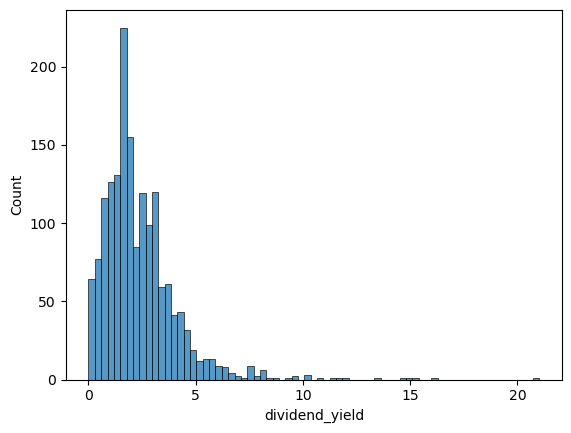

In [31]:
sns.histplot(data, x= data.dividend_yield )

<Axes: xlabel='carbon_intensity', ylabel='Count'>

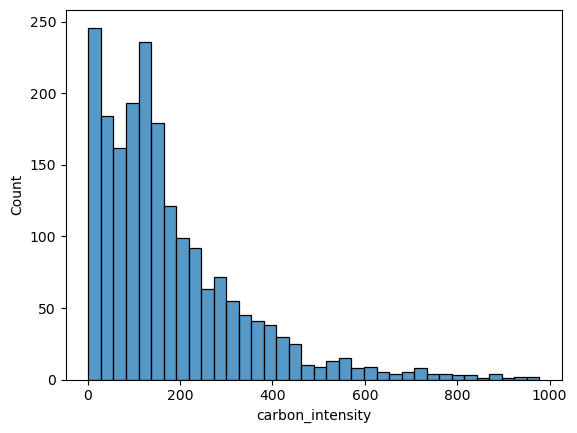

In [32]:
sns.histplot(data, x= data.carbon_intensity )

<Axes: xlabel='esg_rating', ylabel='Count'>

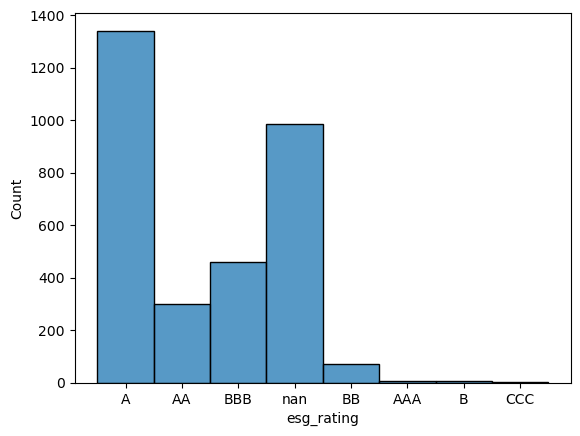

In [33]:
sns.histplot(data, x= data.esg_rating )

<Axes: xlabel='grade', ylabel='Count'>

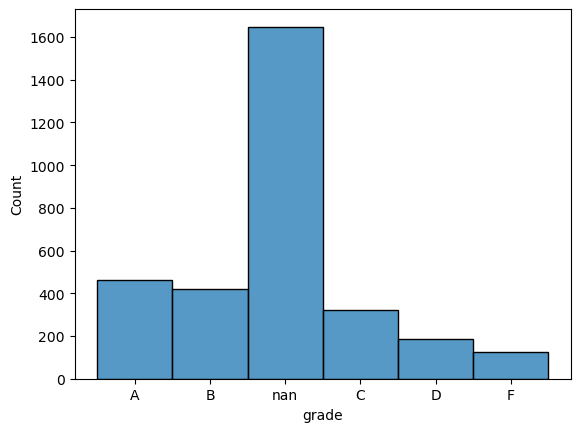

In [34]:

sns.histplot(data, x= data.grade )

<Axes: xlabel='quality_score', ylabel='Count'>

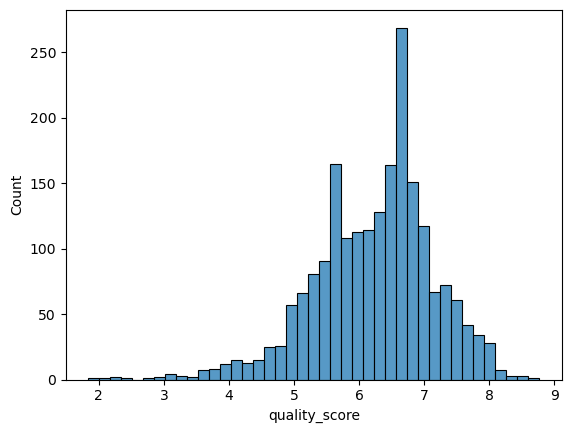

In [35]:

sns.histplot(data, x=data.quality_score)

In [36]:
filters

,Unnamed: 0,invest_strategy,asset_class,asset_region,subsegment,ticker
0,0,standard,equity,region_us,large_cap,SPY
1,1,standard,equity,region_us,large_cap,IVV
2,2,standard,equity,region_us,large_cap,VOO
3,3,standard,equity,region_us,total_market,VTI
4,4,standard,equity,region_us,large_cap,QQQ
...,...,...,...,...,...,...
3163,3163,standard,equity,region_global,total_market,AVNM
3164,3164,leveraged,alternatives,region_global,other,SPKY
3165,3165,standard,equity,region_brics,total_market,FLRU
3166,3166,standard,equity,region_global,total_market,SROI
